# NodalMLP overview

Graph-free SC→FC edge regression backbone. Each node's feature vector is (optionally) a concatenation of anatomical features and its length-`N` SC row (diagonal preserved in its `(i, i)` cell). A shared MLP encodes per-node features; a symmetric pairwise decoder predicts each FC upper-triangle edge.

This notebook is a minimal local dev harness: a hand-tunable config, one short training run via `Sim.run_single`, a loss plot, and a few eval metrics.

In [1]:
import importlib

import matplotlib.pyplot as plt
import numpy as np
import torch

import main
import data
import models.registry
import models.train.lightning_module
import models.train.loss
import models.eval.evaluator
import models.architectures.graph_based.nodal_mlp

importlib.reload(data)
importlib.reload(models.train.loss)
importlib.reload(models.train.lightning_module)
importlib.reload(models.eval.evaluator)
importlib.reload(models.architectures.graph_based.nodal_mlp)
importlib.reload(models.registry)
importlib.reload(main)

from main import Sim

In [2]:
import torch, gc                             
gc.collect()                               
torch.cuda.empty_cache()                     
torch.cuda.ipc_collect()
import os
os.environ["PYTORCH_CUDA_ALLOC_CONF"] = "expandable_segments:True"
print(torch.cuda.memory_summary())         

|===========================================================================|
|                  PyTorch CUDA memory summary, device ID 0                 |
|---------------------------------------------------------------------------|
|            CUDA OOMs: 0            |        cudaMalloc retries: 0         |
|===========================================================================|
|        Metric         | Cur Usage  | Peak Usage | Tot Alloc  | Tot Freed  |
|---------------------------------------------------------------------------|
| Allocated memory      |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |      0 B   |
|       from small pool |      0 B   |      0 B   |      0 B   |      0 B   |
|---------------------------------------------------------------------------|
| Active memory         |      0 B   |      0 B   |      0 B   |      0 B   |
|       from large pool |      0 B   |      0 B   |      0 B   |

## Config (hand-tunable)

Feature flags (`use_volume / use_spatial / use_r2t / use_sc_row`) ablate each feature group independently. `use_encoder=False` bypasses the node encoder and feeds raw per-node features straight into the pairwise decoder. `decoder_symmetry="symmetric"` trains each edge bidirectionally by construction; `"asymmetric"` matches the NodalGNN 4-way concat for apples-to-apples comparison. `sc_row_norm` controls how the SC row is normalized before the encoder (see the math section below).

In [3]:
config_override = {
    "model": {
        "use_volume": False,
        "use_spatial": False,
        "use_r2t": False,
        "use_sc_row": True,
        "device": None,
    },
    "trainer": {
        "lr": 5.0e-4,
        "loss_type": "mse",
        "max_epochs": 300,
        "batch_size": 128,
        "log_every": 2,
    },
}

sim = Sim(
    model_name="NodalMLP",
    config_overrides=config_override,
    source="SC",
    target="FC",
    parcellation="Glasser",
    shuffle_seed=0,
    data_load_mode="precomputed",
)

/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3065: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/ext3/miniforge3/lib/python3.12/site-packages/numpy/lib/_function_base_impl.py:3066: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


## Train

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /scratch/asr655/neuroinformatics/Conn2Conn/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type     | Params | Mode  | FLOPs
-----------------------------------------------------
0 | model   | NodalMLP | 129    | train | 0    
1 | loss_fn | MSELoss  | 0      | train | 0    
-----------------------------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

`Trainer.fit` stopped: `max_epochs=200` reached.



Training complete!


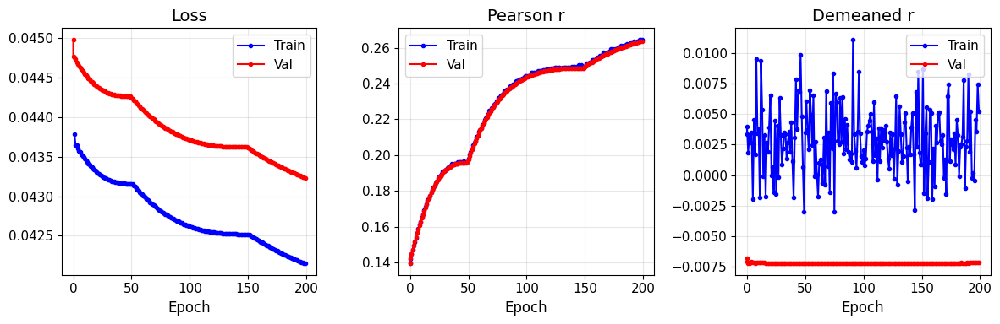

Number of unique demographic categories: 14


/scratch/asr655/neuroinformatics/Conn2Conn/models/eval/evaluator_viz_markdown.py:1190: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


Top-1 accuracy: 0.021  (4 of 195 subjects had rank 1) (chance=0.005)
Average rank percentile: 0.629 (chance=0.5)


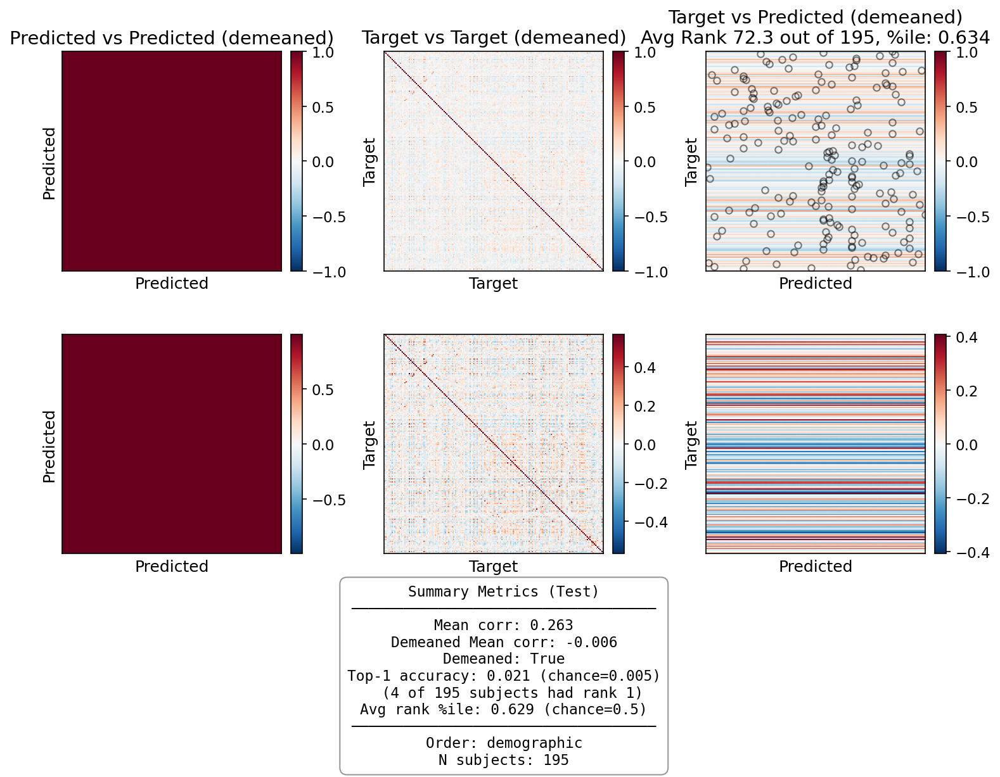

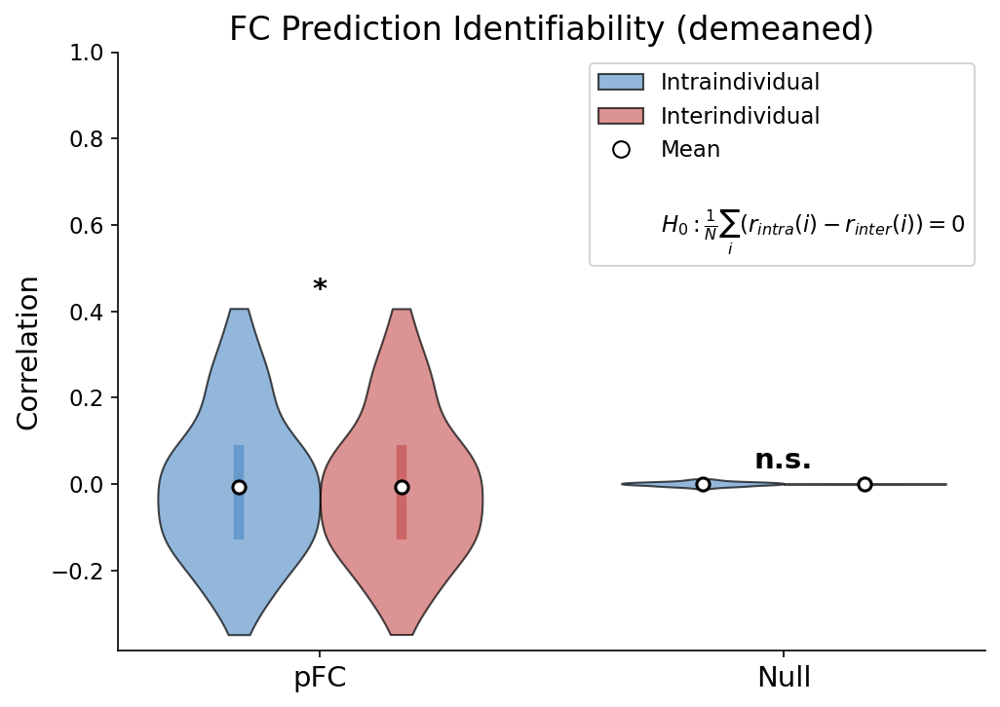


Identifiability Summary:
Condition    r_intra    r_inter    d          t          p            Cohen d   
----------------------------------------------------------------------
pFC          -0.0057    -0.0060    0.0003     6.85       9.32e-11     0.49      
Null         0.0004     -0.0001    0.0005     1.35       1.78e-01     0.10      


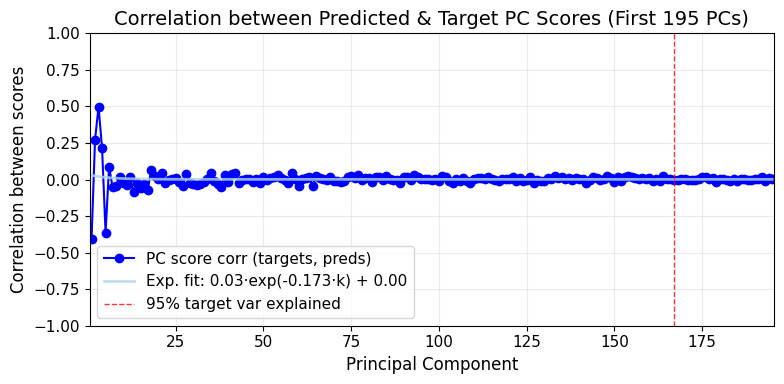

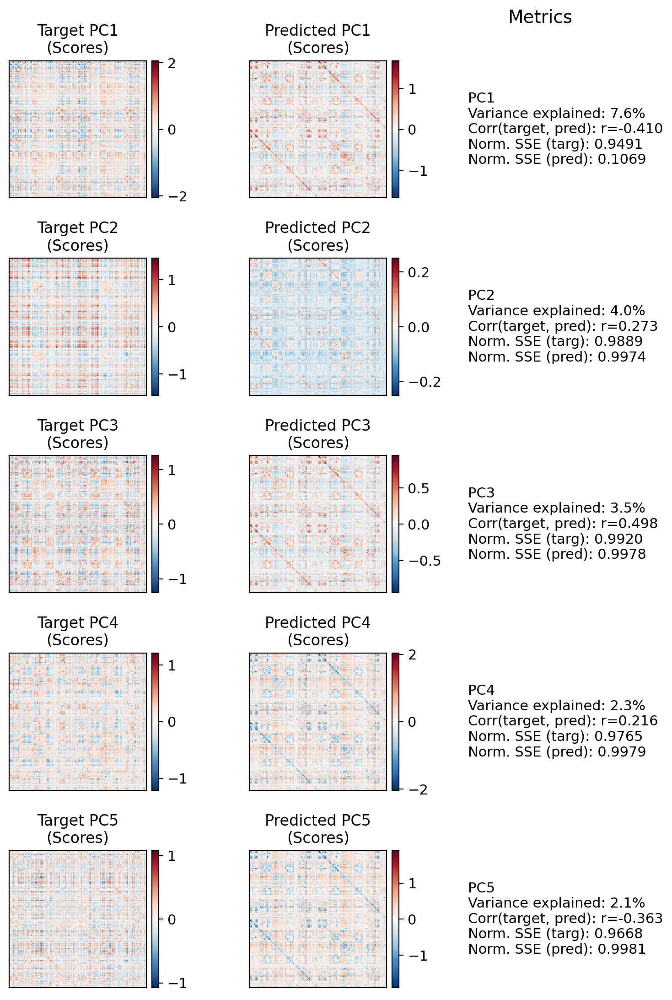

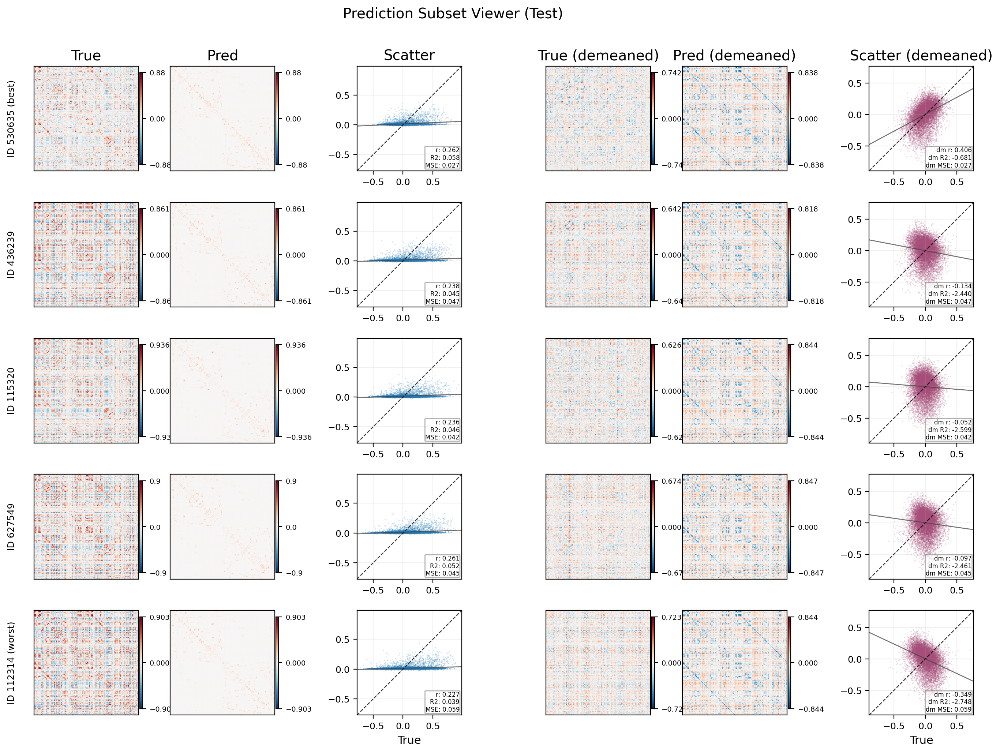

num trainable params: 129
feature_dim (static + sc_row): 0 + 128 = 128
node_embed_dim: 128


In [7]:
config_override = {
    "model": {
        "decoder_type": "diag_bilinear",
        "encoder_type": "spectral",
        "embedding_dim": 128,
        "dropout": 0.0,
        "reg": 0.0, #.0e-6,
        "sc_row_norm": "none",
        "use_volume": False,
        "use_spatial": False,
        "use_r2t": False,
        "use_sc_row": True,
    },
    "trainer": {
        "max_epochs": 200,
        "batch_size": 128,
        "lr": 2.0e-3,
        "loss_type": "mse",
        "log_every": 1,
    },
}

run_out = sim.run_single(
    mode="dev",
    save_checkpoint=False,
    config_override=config_override,
    run_eval=True,
)

model = run_out["model"].eval()
print(f"num trainable params: {model.get_num_params():,}")
print(f"feature_dim (static + sc_row): {model.static_dim} + {model.sc_row_dim} = {model.feature_dim}")
print(f"node_embed_dim: {model.node_embed_dim}")

In [ ]:
config_override = {
    "model": {
        "use_encoder": True,
        "hidden_dim": 96,
        "decoder_dim": [512, 256, 128],
        "dropout": 0.1,
        "reg": 1.0e-6,
        "decoder_symmetry": "asymmetric",
        "sc_row_norm": "brain_scale",
        "use_volume": True,
        "use_spatial": True,
        "use_r2t": True,
        "use_sc_row": True,
    },
    "trainer": {
        "max_epochs": 50,
        "batch_size": 64,
        "lr": 1.0e-3,
        "loss_type": "composite",
        "loss_terms": [
            {"name": "mse", "weight": 1.0},
            {"name": "correye", "weight": 0.1},
            {"name": "neidist", "weight": 0.1},
        ],
        "loss_normalize": "ema",
        "loss_scale_ema_decay": 0.95,
        "loss_scale_warmup_steps": 10,
        "log_every": 1,
    },
}

run_out = sim.run_single(
    mode="dev",
    save_checkpoint=False,
    config_override=config_override,
    run_eval=True,
)

model = run_out["model"].eval()
print(f"num trainable params: {model.get_num_params():,}")
print(f"feature_dim (static + sc_row): {model.static_dim} + {model.sc_row_dim} = {model.feature_dim}")
print(f"node_embed_dim: {model.node_embed_dim}")

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
💡 Tip: For seamless cloud logging and experiment tracking, try installing [litlogger](https://pypi.org/project/litlogger/) to enable LitLogger, which logs metrics and artifacts automatically to the Lightning Experiments platform.
💡 Tip: For seamless cloud uploads and versioning, try installing [litmodels](https://pypi.org/project/litmodels/) to enable LitModelCheckpoint, which syncs automatically with the Lightning model registry.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/callbacks/model_checkpoint.py:881: Checkpoint directory /scratch/asr655/neuroinformatics/Conn2Conn/checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name    | Type          | Params | Mode  | FLOPs
----------------------------------------------------------
0 | model   | NodalMLP      | 183 K  | train | 0    
1 | loss_fn | CompositeLoss | 0      | train | 0    
---------------------

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.
/home/asr655/.local/lib/python3.12/site-packages/lightning/pytorch/trainer/connectors/data_connector.py:434: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=4` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

## Loss curves

In [ ]:
train_result = run_out["train_result"]
train_result.plot(skip_first_n_epochs=2)

## Eval metrics (test split)

In [ ]:
test_metrics = run_out["test_metrics"]["base_metrics"]
for k, v in test_metrics.items():
    if isinstance(v, float):
        print(f"{k:>28s}: {v:.4f}")
    else:
        print(f"{k:>28s}: {v}")

## Pred vs target (one val subject)

In [ ]:
from models.architectures.utils import get_model_input

model_device = next(model.parameters()).device
val_batch = next(iter(sim.val_loader))
x = get_model_input(val_batch).to(model_device)
y = val_batch["y"].to(model_device)
kwargs = {}
if getattr(model, "uses_node_features", False) and "node_features" in val_batch:
    kwargs["node_features"] = val_batch["node_features"].to(model_device)
if getattr(model, "uses_sc_matrix", False) and "sc_matrix" in val_batch:
    kwargs["sc_matrix"] = val_batch["sc_matrix"].to(model_device)

with torch.no_grad():
    y_hat = model(x, **kwargs)

y_np = y[0].detach().cpu().numpy()
y_hat_np = y_hat[0].detach().cpu().numpy()
r = float(np.corrcoef(y_np, y_hat_np)[0, 1])

fig, axes = plt.subplots(1, 2, figsize=(11, 4.5))
axes[0].scatter(y_np, y_hat_np, s=2, alpha=0.35)
lim = [min(y_np.min(), y_hat_np.min()), max(y_np.max(), y_hat_np.max())]
axes[0].plot(lim, lim, "k--", lw=0.8)
axes[0].set_xlabel("FC true (UT)")
axes[0].set_ylabel("FC predicted (UT)")
axes[0].set_title(f"one val subject, Pearson r = {r:.3f}")

idx = np.argsort(y_np)
axes[1].plot(y_np[idx], label="true", lw=0.8)
axes[1].plot(y_hat_np[idx], label="pred", lw=0.8, alpha=0.7)
axes[1].set_xlabel("edge rank (sorted by truth)")
axes[1].set_ylabel("FC value")
axes[1].legend()
plt.tight_layout()
plt.show()

## Math

Let $N$ be the number of parcels and let $M^{(k)} \in \mathbb{R}^{N \times N}$ be the raw SC matrix for subject $k$, with diagonal $M^{(k)}_{ii}$ preserved as the u-fiber self-value. Let $a^{(k)} \in \mathbb{R}^{N \times F_a}$ be the static anatomical node features (volume / centroid / r2t), z-scored against training statistics.

### Per-node feature vector

For node $i$ of subject $k$, define

$$
f^{(k)}_i \;=\; \big[\, \tilde a^{(k)}_i \,\big\Vert\, \tilde r^{(k)}_i \,\big] \;\in\; \mathbb{R}^{F},
$$

where $\tilde r^{(k)}_i = \operatorname{norm}\!\big(M^{(k)}_{i,:}\big)$ is the normalized SC row, with column $j$ always equal to the connectivity of node $i$ with node $j$ (and $j = i$ the self-loop). `sc_row_norm` picks $\operatorname{norm}$:

- `none`: $\tilde r^{(k)}_i = M^{(k)}_{i,:}$
- `col_zscore`: $\tilde r^{(k)}_{i,j} = (M^{(k)}_{i,j} - \mu_{ij}) / \sigma_{ij}$ with $\mu, \sigma$ taken over training subjects per edge $(i, j)$ $\rightarrow$ *cross-subject normalization per edge.*
- `row_zscore`: $\tilde r^{(k)}_{i,:} = (M^{(k)}_{i,:} - \bar M^{(k)}_{i,:})\,/\,\mathrm{std}\!\big(M^{(k)}_{i,:}\big)$ $\rightarrow$ *within-subject, within-node profile shape.*
- `row_l2`: $\tilde r^{(k)}_{i,:} = M^{(k)}_{i,:} / \lVert M^{(k)}_{i,:} \rVert_2$ $\rightarrow$ *scale-free direction.*
- `brain_scale`: $\tilde r^{(k)}_{i,j} = M^{(k)}_{i,j} / \overline{M^{(k)}}$, dividing by the subject's mean SC value $\rightarrow$ *within-subject brain-wide rescaling; preserves relative strength within-node and across the whole brain.*

### Encoder

A shared MLP embeds each node's feature vector:

$$
h^{(k)}_i \;=\; \operatorname{Enc}\!\big(f^{(k)}_i\big) \;\in\; \mathbb{R}^{D}.
$$

When `use_encoder=False`, $\operatorname{Enc}$ is the identity and $D = F$.

### Pairwise decoder

For each target upper-triangle edge $(i, j)$ with $i < j$,

$$
e^{(k)}_{ij} \;=\; \Big[\, h^{(k)}_i + h^{(k)}_j \;\big\Vert\; \big|\,h^{(k)}_i - h^{(k)}_j\,\big| \;\big\Vert\; h^{(k)}_i \odot h^{(k)}_j \,\Big]
\qquad\text{(symmetric)}
$$

or, when `decoder_symmetry="asymmetric"`,

$$
e^{(k)}_{ij} \;=\; \Big[\, h^{(k)}_i \;\big\Vert\; h^{(k)}_j \;\big\Vert\; \big|\,h^{(k)}_i - h^{(k)}_j\,\big| \;\big\Vert\; h^{(k)}_i \odot h^{(k)}_j \,\Big].
$$

A small MLP maps $e^{(k)}_{ij}$ to a scalar prediction:

$$
\widehat{FC}^{(k)}_{ij} \;=\; \operatorname{Dec}\!\big(e^{(k)}_{ij}\big).
$$

In the symmetric case, $e^{(k)}_{ij}$ is invariant under swapping $i \leftrightarrow j$, so each edge is trained bidirectionally by construction.

### Loss

With targets $FC^{(k)}_{ij}$ over the upper triangle,

$$
\mathcal{L} \;=\; \frac{1}{B \cdot E} \sum_k \sum_{i<j} \big(\widehat{FC}^{(k)}_{ij} - FC^{(k)}_{ij}\big)^2 \;+\; \lambda \sum_{\theta \in \Theta_{\ge 2}} \lVert \theta \rVert_2,
$$

where $\Theta_{\ge 2}$ is the set of weight tensors with `ndim >= 2` and $\lambda$ is `reg`.

### Contrast with `NodalGNN`

`NodalGNN` applies GCN message passing over the subject's SC-weighted graph before decoding, so $h^{(k)}_i$ mixes information across SC neighbors. `NodalMLP` removes the conv stack: $h^{(k)}_i$ depends only on node $i$'s own feature vector. The SC row (`use_sc_row=True`) is what carries subject-specific connectivity into this graph-free path.